<a href="https://colab.research.google.com/github/sagarpuniyani/neural_netwok/blob/main/perceptor_train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
path = '/content/drive/MyDrive/research work /preceptron/student.csv'

In [4]:
df = pd.read_csv(path)

In [5]:
df

,cgpa,resume_score,placed
0,8.14,6.52,1
1,6.17,5.17,0
2,8.27,8.96,1
3,6.88,7.27,1
4,7.52,7.35,1
5,9.10,9.30,1
6,6.20,9.20,1
7,8.60,8.50,1
8,3.20,4.50,0
9,6.70,8.40,0


<Axes: xlabel='cgpa', ylabel='resume_score'>

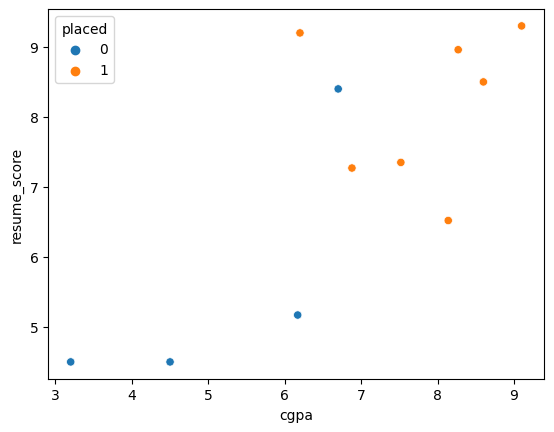

In [6]:
sns.scatterplot(x=df['cgpa'],y=df['resume_score'],hue=df['placed'])

In [7]:
X = df.iloc[:, [0, 1]]
y = df['placed'].values

In [8]:
from sklearn.linear_model import Perceptron
p = Perceptron()

In [9]:
p.fit( X , y)

Perceptron()

In [10]:
p.coef_

array([[11.31,  3.94]])

In [11]:
p.intercept_
# can draw the plot_decision_regions

array([-8.])

## preceptron trick


In [12]:
from sklearn.datasets import make_classification

X, y = make_classification(
    n_samples=100,  # Number of samples
    n_features=2,  # Number of features
    n_informative=1,  # Number of informative features
    n_redundant=0,  # Number of redundant features
    n_classes = 2, # Number of the classes
    n_clusters_per_class=1,  # Number of clusters per class
    random_state=41 ,
    hypercube = False ,
    class_sep=10
)

# from sklearn.datasets import make_classification
# import numpy as np
# X, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
#                            n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=10)

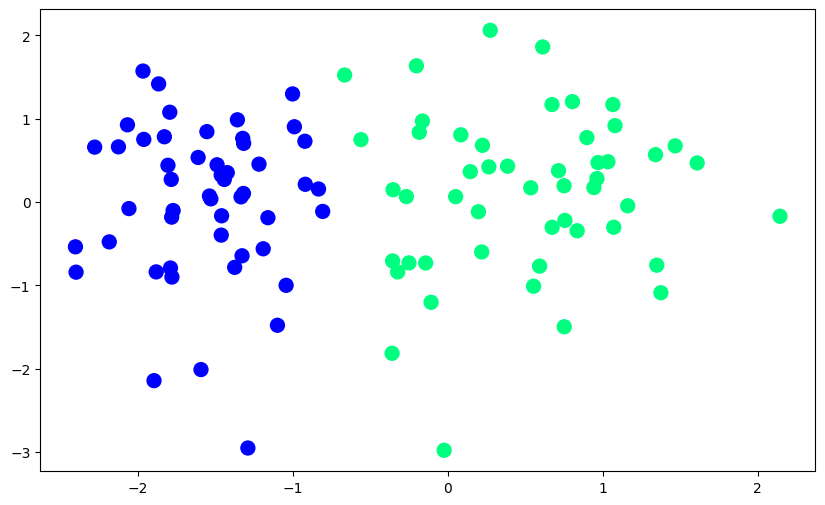

In [13]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0] , X[:,1] , c=y , cmap='winter' , s=100 )

In [14]:
def step(z):
  return 1 if z>0 else 0

In [15]:
def perceptron(X , y):
  X = np.insert(X ,0,1 , axis=1)
  weights = np.ones(X.shape[1])
  lr = 0.1

  for i in range(1000):
    j = np.random.randint(0,100)
    y_hat = step(np.dot(X[j] , weights))
    weights = weights + lr*(y[j] - y_hat)*X[j]

  return weights[0] , weights[1:]

In [16]:
intercept_ , coef_ = perceptron(X , y)

In [17]:
print(intercept_)
print(coef_)

1.0
[1.34453358 0.09857049]


In [18]:
# m is the slope of the line
# c is the intercept of the line
# equation of line is y=mx + c.

m = -(coef_[0]/coef_[1])
c = -(intercept_/coef_[1])

In [19]:
x_input = np.linspace(-3 ,3,100)
y_input = m*x_input + c

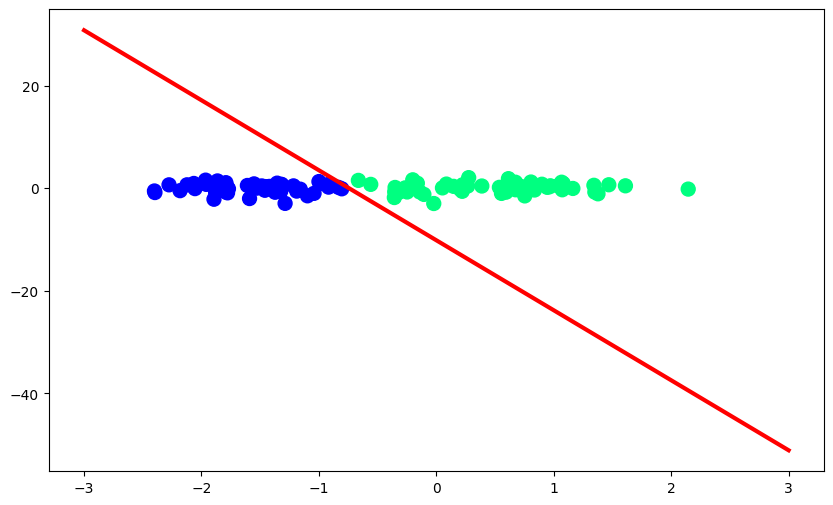

In [20]:
plt.figure(figsize=(10,6))
plt.plot(x_input , y_input , color='red' , linewidth=3)
plt.scatter(X[:,0] , X[:,1] , c=y , cmap='winter' , s=100 )

In [21]:
def perceptron_animation(X , y):

  m=[]
  b=[]

  X = np.insert(X ,0,1 , axis=1)
  weights = np.ones(X.shape[1])
  lr = 0.1

  for i in range(200):
    j = np.random.randint(0,100)
    y_hat = step(np.dot(X[j] , weights))
    weights = weights + lr*(y[j] - y_hat)*X[j]

    m.append(-(weights[1])/weights[2])
    b.append(-(weights[0])/weights[2])

  return m , b

In [22]:
m ,b  = perceptron_animation(X , y)

In [23]:
%matplotlib notebook
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation

In [24]:
y

array([1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1])

In [25]:
from pandas._libs import interval
from IPython.display import HTML
fig , ax = plt.subplots(figsize=(8,4))

x_i = np.arange(-3 , 3 , 0.1)
y_i = x_i * m[0] + b[0]
ax.scatter(X[:,0],X[:,1],c=y , cmap='winter',s=100)
line , = ax.plot(x_i , x_i*m[0]+b[0] , 'r-' , linewidth = 3)


def update(i):
  label  = 'epoch {0}'.format(i + 1)
  line.set_ydata(x_i*m[i] + b[i])
  ax.set_xlabel(label)
  return line , ax

# Create the animation
anim = FuncAnimation(fig, update, repeat=True, frames=200, interval=100)

# Display the animation
HTML(anim.to_jshtml())


<IPython.core.display.Javascript object>